# Capstone Project: Create a Customer Segmentation Report for Arvato Financial Services

In this project, you will analyze demographics data for customers of a mail-order sales company in Germany, comparing it against demographics information for the general population. You'll use unsupervised learning techniques to perform customer segmentation, identifying the parts of the population that best describe the core customer base of the company. Then, you'll apply what you've learned on a third dataset with demographics information for targets of a marketing campaign for the company, and use a model to predict which individuals are most likely to convert into becoming customers for the company. The data that you will use has been provided by our partners at Bertelsmann Arvato Analytics, and represents a real-life data science task.

If you completed the first term of this program, you will be familiar with the first part of this project, from the unsupervised learning project. The versions of those two datasets used in this project will include many more features and has not been pre-cleaned. You are also free to choose whatever approach you'd like to analyzing the data rather than follow pre-determined steps. In your work on this project, make sure that you carefully document your steps and decisions, since your main deliverable for this project will be a blog post reporting your findings.

In [1]:
# import libraries here; add more as necessary
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import workspace_utils
from sklearn.cluster import KMeans

# magic word for producing visualizations in notebook
%matplotlib inline

## Part 0: Get to Know the Data

There are four data files associated with this project:

- `Udacity_AZDIAS_052018.csv`: Demographics data for the general population of Germany; 891 211 persons (rows) x 366 features (columns).
- `Udacity_CUSTOMERS_052018.csv`: Demographics data for customers of a mail-order company; 191 652 persons (rows) x 369 features (columns).
- `Udacity_MAILOUT_052018_TRAIN.csv`: Demographics data for individuals who were targets of a marketing campaign; 42 982 persons (rows) x 367 (columns).
- `Udacity_MAILOUT_052018_TEST.csv`: Demographics data for individuals who were targets of a marketing campaign; 42 833 persons (rows) x 366 (columns).

Each row of the demographics files represents a single person, but also includes information outside of individuals, including information about their household, building, and neighborhood. Use the information from the first two files to figure out how customers ("CUSTOMERS") are similar to or differ from the general population at large ("AZDIAS"), then use your analysis to make predictions on the other two files ("MAILOUT"), predicting which recipients are most likely to become a customer for the mail-order company.

The "CUSTOMERS" file contains three extra columns ('CUSTOMER_GROUP', 'ONLINE_PURCHASE', and 'PRODUCT_GROUP'), which provide broad information about the customers depicted in the file. The original "MAILOUT" file included one additional column, "RESPONSE", which indicated whether or not each recipient became a customer of the company. For the "TRAIN" subset, this column has been retained, but in the "TEST" subset it has been removed; it is against that withheld column that your final predictions will be assessed in the Kaggle competition.

Otherwise, all of the remaining columns are the same between the three data files. For more information about the columns depicted in the files, you can refer to two Excel spreadsheets provided in the workspace. [One of them](./DIAS Information Levels - Attributes 2017.xlsx) is a top-level list of attributes and descriptions, organized by informational category. [The other](./DIAS Attributes - Values 2017.xlsx) is a detailed mapping of data values for each feature in alphabetical order.

In the below cell, we've provided some initial code to load in the first two datasets. Note for all of the `.csv` data files in this project that they're semicolon (`;`) delimited, so an additional argument in the [`read_csv()`](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.read_csv.html) call has been included to read in the data properly. Also, considering the size of the datasets, it may take some time for them to load completely.

You'll notice when the data is loaded in that a warning message will immediately pop up. Before you really start digging into the modeling and analysis, you're going to need to perform some cleaning. Take some time to browse the structure of the data and look over the informational spreadsheets to understand the data values. Make some decisions on which features to keep, which features to drop, and if any revisions need to be made on data formats. It'll be a good idea to create a function with pre-processing steps, since you'll need to clean all of the datasets before you work with them.

In [45]:
# load in the data
azdias = pd.read_csv('../../data/Term2/capstone/arvato_data/Udacity_AZDIAS_052018.csv', sep=';')
customers = pd.read_csv('../../data/Term2/capstone/arvato_data/Udacity_CUSTOMERS_052018.csv', sep=';')

/opt/conda/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (18,19) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [46]:
azdias.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891221 entries, 0 to 891220
Data columns (total 366 columns):
LNR                            int64
AGER_TYP                       int64
AKT_DAT_KL                     float64
ALTER_HH                       float64
ALTER_KIND1                    float64
ALTER_KIND2                    float64
ALTER_KIND3                    float64
ALTER_KIND4                    float64
ALTERSKATEGORIE_FEIN           float64
ANZ_HAUSHALTE_AKTIV            float64
ANZ_HH_TITEL                   float64
ANZ_KINDER                     float64
ANZ_PERSONEN                   float64
ANZ_STATISTISCHE_HAUSHALTE     float64
ANZ_TITEL                      float64
ARBEIT                         float64
BALLRAUM                       float64
CAMEO_DEU_2015                 object
CAMEO_DEUG_2015                object
CAMEO_INTL_2015                object
CJT_GESAMTTYP                  float64
CJT_KATALOGNUTZER              float64
CJT_TYP_1                      float6

In [47]:
azdias.info(memory_usage = "deep") 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891221 entries, 0 to 891220
Columns: 366 entries, LNR to ALTERSKATEGORIE_GROB
dtypes: float64(267), int64(93), object(6)
memory usage: 2.7 GB


In [48]:
for dtype in ['float', 'int', 'object']:
    selected_dtype = azdias.select_dtypes(include = [dtype])
    mean_usage_b = selected_dtype.memory_usage(deep = True).mean()
    mean_usage_mb = mean_usage_b/1024 ** 2
    print("Average memory usage for {} columns: {:03.2f} MB".format(dtype,mean_usage_mb))

Average memory usage for float columns: 6.77 MB
Average memory usage for int columns: 6.73 MB
Average memory usage for object columns: 41.93 MB


Lets see if we can change the column datatype to make computing easier. Next function is taken from dataquest to convert memory usage. 

In [49]:
def mem_usage(pandas_obj):
    if isinstance(pandas_obj,pd.DataFrame):
        usage_b = pandas_obj.memory_usage(deep=True).sum()
    else: # we assume if not a df it's a series
        usage_b = pandas_obj.memory_usage(deep=True)
    usage_mb = usage_b / 1024 ** 2 # convert bytes to megabytes
    return "{:03.2f} MB".format(usage_mb)

azdias_int = azdias.select_dtypes(include=['int'])
converted_int = azdias_int.apply(pd.to_numeric,downcast='unsigned')
print(mem_usage(azdias_int))
print(mem_usage(converted_int))
compare_ints = pd.concat([azdias_int.dtypes,converted_int.dtypes],axis=1)
compare_ints.columns = ['before','after']
compare_ints.apply(pd.Series.value_counts)

632.35 MB
106.24 MB


,before,after
uint8,NaN,87
uint16,NaN,1
uint32,NaN,1
int64,93.0,4


In [50]:
print("The above function reduces the footprint of int columns by: " + str(round((100 *(636.25 - 106.24))/636.25)) + " percent" )

The above function reduces the footprint of int columns by: 83 percent


That was quite the reduction! Lets see if we can get a reduction for float columns. I can guess already that the savings will be enourmous. 

In [51]:
azdias_floats = azdias.select_dtypes(include = ['float'])
converted_floats = azdias_floats.apply(pd.to_numeric, downcast = 'float')
print(mem_usage(azdias_floats))
print(mem_usage(converted_floats))
compare_floats = pd.concat([azdias_floats.dtypes, converted_floats.dtypes], axis = 1)
compare_floats.columns = ['before', 'after']
compare_floats.apply(pd.Series.value_counts)


1815.46 MB
907.73 MB


,before,after
float32,NaN,267.0
float64,267.0,NaN


Exciting! We have a 50% reduction in memory usage. Now, let us grab a copy of the dataframe and convert all the columns. 

In [52]:
optimized_azdias = azdias.copy()
optimized_azdias[converted_int.columns] = converted_int
optimized_azdias[converted_floats.columns] = converted_floats
print(mem_usage(azdias))
print(mem_usage(optimized_azdias))

2741.29 MB
1307.45 MB


This one took quite a bit to run but we cut the amount of memory used by half. This is good. We can use the optimized dataframe for our preprocessing. I tried running the cleaning with the original dataframe but it took too long. fillna just wasnt efficient as desired. 

In [53]:
customers.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 191652 entries, 0 to 191651
Data columns (total 369 columns):
LNR                            int64
AGER_TYP                       int64
AKT_DAT_KL                     float64
ALTER_HH                       float64
ALTER_KIND1                    float64
ALTER_KIND2                    float64
ALTER_KIND3                    float64
ALTER_KIND4                    float64
ALTERSKATEGORIE_FEIN           float64
ANZ_HAUSHALTE_AKTIV            float64
ANZ_HH_TITEL                   float64
ANZ_KINDER                     float64
ANZ_PERSONEN                   float64
ANZ_STATISTISCHE_HAUSHALTE     float64
ANZ_TITEL                      float64
ARBEIT                         float64
BALLRAUM                       float64
CAMEO_DEU_2015                 object
CAMEO_DEUG_2015                object
CAMEO_INTL_2015                object
CJT_GESAMTTYP                  float64
CJT_KATALOGNUTZER              float64
CJT_TYP_1                      float6

In [54]:
customers.info(memory_usage = "deep") 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 191652 entries, 0 to 191651
Columns: 369 entries, LNR to ALTERSKATEGORIE_GROB
dtypes: float64(267), int64(94), object(8)
memory usage: 613.7 MB


In [55]:
azdias['CAMEO_DEUG_2015'] = pd.to_numeric(azdias['CAMEO_DEUG_2015'], errors = 'coerce')

azdias['CAMEO_INTL_2015'] = pd.to_numeric(azdias['CAMEO_INTL_2015'], errors = 'coerce')

In [56]:
def preprocess_azdias(azdias):
    azdias['CAMEO_DEUG_2015'] = pd.to_numeric(azdias['CAMEO_DEUG_2015'], errors = 'coerce')

    azdias['CAMEO_INTL_2015'] = pd.to_numeric(azdias['CAMEO_INTL_2015'], errors = 'coerce')
    
    #subset df 
    
    azdias_int = azdias.select_dtypes(include = ['int64','uint8', 'uint16', 'uint32'])
    azdias_float = azdias.select_dtypes(include = 'float32')
    azdias_object = azdias.select_dtypes(include = 'object')
    
    #fill na 
    
    azdias_int.fillna(-1)
    azdias_float.fillna(-1)
    
    #drop unecessary columns 
    azdias_float = azdias_float.drop(['ALTER_KIND1', 'ALTER_KIND2', 'ALTER_KIND3', 'ALTER_KIND4'], axis = 1)
    
    azdias = pd.concat([azdias_int, azdias_float, azdias_object], axis = 1) 
    
    return azdias
    
    

In [57]:
def preprocess_customers(customers):
    customers['CAMEO_DEUG_2015'] = pd.to_numeric(customers['CAMEO_DEUG_2015'], errors = 'coerce')

    customers['CAMEO_INTL_2015'] = pd.to_numeric(customers['CAMEO_DEUG_2015'], errors = 'coerce')
    
    #split dataframe into subsets by datatype
    customers_int = customers.select_dtypes(include = 'int64')
    customers_float = customers.select_dtypes(include = 'float64')
    customers_object = customers.select_dtypes(include ='object')
    
    #Handle Nans in unique way for each datatype
    customers_int.fillna(-1)
    customers_float.fillna(-1)
    
    customers_float = customers_float.drop(['ALTER_KIND1', 'ALTER_KIND2', 'ALTER_KIND3', 'ALTER_KIND4'], axis = 1 )
    
    customers = pd.concat([customers_int, customers_float, customers_object], axis = 1)
    
    return customers 

In [58]:
optimized_azdias.to_csv('Optimized_Azdias.csv', sep = ';')

In [59]:
processed_optimized_azdias = preprocess_azdias(optimized_azdias)

processed_optimized_azdias.to_csv('processed_optimized_azdias.csv', sep = ';')

In [60]:
preprocessed_customers = preprocess_customers(customers)

preprocessed_customers.to_csv('preprocessed_customers.csv', sep = ';')

## Part 1: Customer Segmentation Report

The main bulk of your analysis will come in this part of the project. Here, you should use unsupervised learning techniques to describe the relationship between the demographics of the company's existing customers and the general population of Germany. By the end of this part, you should be able to describe parts of the general population that are more likely to be part of the mail-order company's main customer base, and which parts of the general population are less so.

Lets first see the size of the datasets

In [4]:
azdias = pd.read_csv('processed_optimized_azdias.csv', sep = ';')

In [5]:
customers = pd.read_csv('preprocessed_customers.csv', sep = ';')

In [6]:
def numerical_dataframe(df):
    
    # your code here
    
    df_object = df.select_dtypes(include = "object")
    
    columns_list = df_object.columns
    
    for column in columns_list:
        df_object[column] = df_object[column].astype('category')
        df_object[column] = df_object[column].cat.codes
        
    
    df = df.select_dtypes(exclude = "object")
    
    df = pd.concat([df, df_object], axis = 1)
    
    return df

In [7]:
azdias = numerical_dataframe(azdias)

customers = numerical_dataframe(customers)

azdias = azdias.dropna()

azdias = azdias.drop(['Unnamed: 0', 'LNR'], axis = 1)

customers = customers.dropna()

customers = customers.drop(['Unnamed: 0', 'LNR'], axis = 1)

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # This is added back by InteractiveShellApp.init_path()


Now we want to take a look at a small portion of each of the datasets. Lets use the head function for both. 

In [9]:

azdias = azdias.dropna()

#azdias = azdias.drop(['Unnamed: 0', 'LNR'], axis = 1)

azdias.head()

,AGER_TYP,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_DIREKT,D19_BANKEN_GROSS,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_REST,...,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,CAMEO_DEU_2015,D19_LETZTER_KAUF_BRANCHE,EINGEFUEGT_AM,OST_WEST_KZ
5,3,0,0,10,0,0,0,10,10,0,...,10.0,7.0,4.0,6.0,9.0,7.0,37,11,3,1
9,-1,0,0,8,6,6,0,10,8,0,...,1.0,1.0,1.0,4.0,3.0,7.0,4,17,2,1
45,1,0,0,10,7,0,7,10,10,0,...,3.0,4.0,2.0,1.0,9.0,7.0,30,32,786,1
79,-1,2,4,1,5,1,0,10,7,6,...,1.0,1.0,1.0,2.0,5.0,4.0,36,1,2,1
87,-1,0,0,10,0,0,0,10,10,0,...,2.0,3.0,2.0,2.0,9.0,3.0,4,25,2,1


In [11]:
customers = customers.dropna()

#customers = customers.drop(['Unnamed: 0', 'LNR'], axis = 1)

customers.head()


,AGER_TYP,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_DIREKT,D19_BANKEN_GROSS,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_REST,...,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,CAMEO_DEU_2015,D19_LETZTER_KAUF_BRANCHE,EINGEFUEGT_AM,OST_WEST_KZ,PRODUCT_GROUP,CUSTOMER_GROUP
6,2,0,0,10,0,0,0,10,10,0,...,2.0,6.0,9.0,7.0,10,10,0,1,1,0
7,1,0,0,10,0,0,0,10,10,0,...,1.0,6.0,9.0,3.0,3,25,0,1,2,1
11,1,0,0,10,0,0,0,10,10,0,...,2.0,6.0,3.0,4.0,8,26,0,1,2,1
14,2,2,2,3,3,3,0,10,3,0,...,3.0,6.0,7.0,3.0,42,1,0,1,1,0
15,2,0,0,10,0,0,0,10,10,0,...,2.0,2.0,9.0,2.0,3,25,1,1,1,0


In [12]:
azdias.describe()

,AGER_TYP,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_DIREKT,D19_BANKEN_GROSS,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_REST,...,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,CAMEO_DEU_2015,D19_LETZTER_KAUF_BRANCHE,EINGEFUEGT_AM,OST_WEST_KZ
count,112843.000000,112843.000000,112843.000000,112843.000000,112843.000000,112843.000000,112843.000000,112843.000000,112843.000000,112843.000000,...,112843.000000,112843.000000,112843.000000,112843.000000,112843.000000,112843.000000,112843.000000,112843.000000,112843.000000,112843.000000
mean,0.188359,0.351090,0.569925,8.187145,1.793917,1.144041,0.239652,9.714479,8.659598,1.021056,...,2.767730,3.207474,2.403047,3.499278,8.559804,4.204160,18.565653,18.882749,199.169359,0.802052
std,1.398541,0.854711,1.128631,2.520102,2.496602,2.133957,1.175873,1.157237,2.312029,2.187572,...,1.832917,1.828784,1.422791,1.892188,1.277362,2.117916,11.542682,11.016842,486.714079,0.398454
min,-1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,...,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,-1.000000,0.000000,1.000000,0.000000
25%,-1.000000,0.000000,0.000000,7.000000,0.000000,0.000000,0.000000,10.000000,8.000000,0.000000,...,1.000000,1.000000,1.000000,2.000000,9.000000,3.000000,9.000000,8.000000,2.000000,1.000000
50%,-1.000000,0.000000,0.000000,9.000000,0.000000,0.000000,0.000000,10.000000,10.000000,0.000000,...,2.000000,3.000000,2.000000,3.000000,9.000000,3.000000,15.000000,21.000000,2.000000,1.000000
75%,1.000000,0.000000,1.000000,10.000000,4.000000,1.000000,0.000000,10.000000,10.000000,0.000000,...,4.000000,5.000000,3.000000,6.000000,9.000000,7.000000,28.000000,31.000000,3.000000,1.000000
max,3.000000,6.000000,6.000000,10.000000,7.000000,6.000000,7.000000,10.000000,10.000000,7.000000,...,10.000000,13.000000,11.000000,6.000000,9.000000,8.000000,44.000000,34.000000,2821.000000,1.000000


In [13]:
customers.describe()

,AGER_TYP,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_DIREKT,D19_BANKEN_GROSS,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_REST,...,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,CAMEO_DEU_2015,D19_LETZTER_KAUF_BRANCHE,EINGEFUEGT_AM,OST_WEST_KZ,PRODUCT_GROUP,CUSTOMER_GROUP
count,54251.000000,54251.000000,54251.000000,54251.000000,54251.000000,54251.000000,54251.000000,54251.000000,54251.000000,54251.000000,...,54251.000000,54251.000000,54251.000000,54251.000000,54251.000000,54251.000000,54251.000000,54251.000000,54251.000000,54251.000000
mean,0.944646,0.227535,0.360768,8.618496,1.216236,0.806750,0.221194,9.625850,9.153177,0.843155,...,1.926029,3.863579,8.828943,3.795801,16.052718,18.216844,125.181324,0.924481,1.010544,0.321229
std,1.259806,0.628000,0.851446,2.309575,2.237668,1.879984,1.140973,1.280535,1.987394,2.029853,...,1.142091,1.935948,0.805541,2.138434,11.068347,10.546416,333.970309,0.264230,0.700888,0.466953
min,-1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,...,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,8.000000,0.000000,0.000000,0.000000,10.000000,10.000000,0.000000,...,1.000000,2.000000,9.000000,2.000000,8.000000,8.000000,0.000000,1.000000,1.000000,0.000000
50%,1.000000,0.000000,0.000000,10.000000,0.000000,0.000000,0.000000,10.000000,10.000000,0.000000,...,2.000000,4.000000,9.000000,3.000000,13.000000,18.000000,1.000000,1.000000,1.000000,0.000000
75%,2.000000,0.000000,0.000000,10.000000,1.000000,0.000000,0.000000,10.000000,10.000000,0.000000,...,2.000000,6.000000,9.000000,7.000000,25.000000,26.000000,1.000000,1.000000,2.000000,1.000000
max,3.000000,6.000000,6.000000,10.000000,7.000000,6.000000,7.000000,10.000000,10.000000,7.000000,...,11.000000,6.000000,9.000000,8.000000,43.000000,34.000000,2052.000000,1.000000,2.000000,1.000000


Lets get all the features that we can work with for the datasets. We can use the column.values method to do so. 

In [14]:
azdias.columns.values

array(['AGER_TYP', 'D19_BANKEN_ANZ_12', 'D19_BANKEN_ANZ_24',
       'D19_BANKEN_DATUM', 'D19_BANKEN_DIREKT', 'D19_BANKEN_GROSS',
       'D19_BANKEN_LOKAL', 'D19_BANKEN_OFFLINE_DATUM',
       'D19_BANKEN_ONLINE_DATUM', 'D19_BANKEN_REST', 'D19_BEKLEIDUNG_GEH',
       'D19_BEKLEIDUNG_REST', 'D19_BILDUNG', 'D19_BIO_OEKO', 'D19_BUCH_CD',
       'D19_DIGIT_SERV', 'D19_DROGERIEARTIKEL', 'D19_ENERGIE',
       'D19_FREIZEIT', 'D19_GARTEN', 'D19_GESAMT_ANZ_12',
       'D19_GESAMT_ANZ_24', 'D19_GESAMT_DATUM', 'D19_GESAMT_OFFLINE_DATUM',
       'D19_GESAMT_ONLINE_DATUM', 'D19_HANDWERK', 'D19_HAUS_DEKO',
       'D19_KINDERARTIKEL', 'D19_KONSUMTYP_MAX', 'D19_KOSMETIK',
       'D19_LEBENSMITTEL', 'D19_NAHRUNGSERGAENZUNG', 'D19_RATGEBER',
       'D19_REISEN', 'D19_SAMMELARTIKEL', 'D19_SCHUHE', 'D19_SONSTIGE',
       'D19_TECHNIK', 'D19_TELKO_ANZ_12', 'D19_TELKO_ANZ_24',
       'D19_TELKO_DATUM', 'D19_TELKO_MOBILE', 'D19_TELKO_OFFLINE_DATUM',
       'D19_TELKO_ONLINE_DATUM', 'D19_TELKO_REST', 'D19_TIER

In [15]:
customers.columns.values

array(['AGER_TYP', 'D19_BANKEN_ANZ_12', 'D19_BANKEN_ANZ_24',
       'D19_BANKEN_DATUM', 'D19_BANKEN_DIREKT', 'D19_BANKEN_GROSS',
       'D19_BANKEN_LOKAL', 'D19_BANKEN_OFFLINE_DATUM',
       'D19_BANKEN_ONLINE_DATUM', 'D19_BANKEN_REST', 'D19_BEKLEIDUNG_GEH',
       'D19_BEKLEIDUNG_REST', 'D19_BILDUNG', 'D19_BIO_OEKO', 'D19_BUCH_CD',
       'D19_DIGIT_SERV', 'D19_DROGERIEARTIKEL', 'D19_ENERGIE',
       'D19_FREIZEIT', 'D19_GARTEN', 'D19_GESAMT_ANZ_12',
       'D19_GESAMT_ANZ_24', 'D19_GESAMT_DATUM', 'D19_GESAMT_OFFLINE_DATUM',
       'D19_GESAMT_ONLINE_DATUM', 'D19_HANDWERK', 'D19_HAUS_DEKO',
       'D19_KINDERARTIKEL', 'D19_KONSUMTYP_MAX', 'D19_KOSMETIK',
       'D19_LEBENSMITTEL', 'D19_NAHRUNGSERGAENZUNG', 'D19_RATGEBER',
       'D19_REISEN', 'D19_SAMMELARTIKEL', 'D19_SCHUHE', 'D19_SONSTIGE',
       'D19_TECHNIK', 'D19_TELKO_ANZ_12', 'D19_TELKO_ANZ_24',
       'D19_TELKO_DATUM', 'D19_TELKO_MOBILE', 'D19_TELKO_OFFLINE_DATUM',
       'D19_TELKO_ONLINE_DATUM', 'D19_TELKO_REST', 'D19_TIER

There is still so many columns to deal with. Feature reduction is going to be necessary to analyze this dataset. PCA analyis will be necessary to reduce the dimensionality of the dataset. 

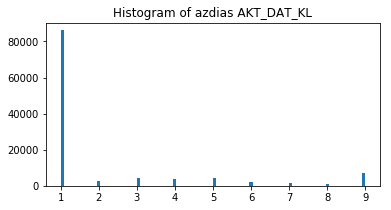

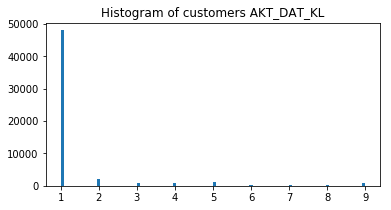

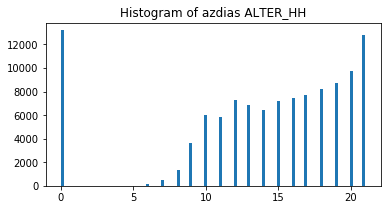

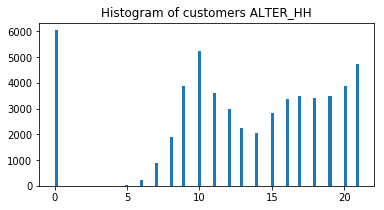

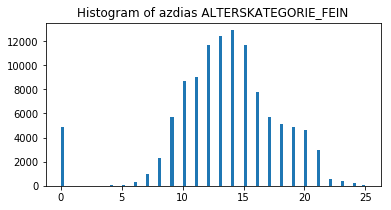

...

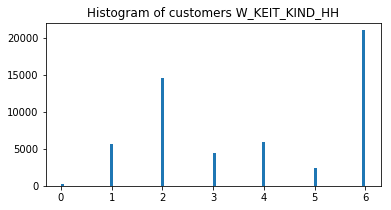

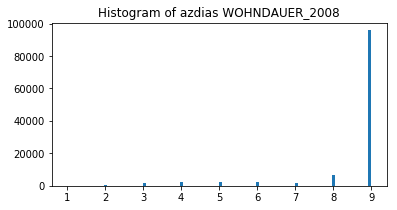

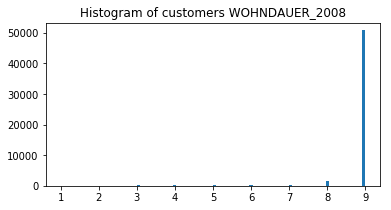

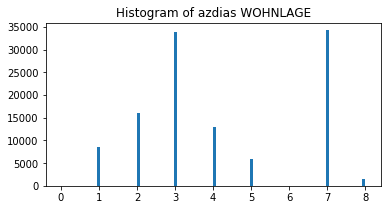

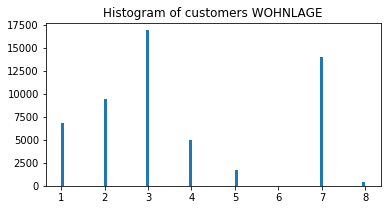

In [16]:
# float features
float_features = azdias.select_dtypes(include = 'float').columns
n_bins = 100 # can decrease to get a wider bin (or vice versa)

for column_name in float_features:
    ax=plt.subplots(figsize=(6,3))
    # get data by column_name and display a histogram
    ax = plt.hist(azdias[column_name], bins=n_bins)
    title="Histogram of azdias " + column_name
    plt.title(title, fontsize=12)
    
    ax1 = plt.subplots(figsize=(6,3))
    ax1 = plt.hist(customers[column_name], bins = n_bins)
    title1 = "Histogram of customers " + column_name
    plt.title(title1, fontsize = 12)
    plt.show()

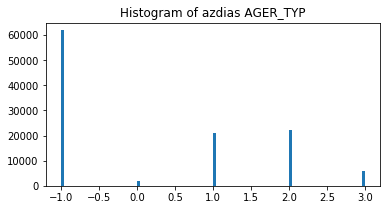

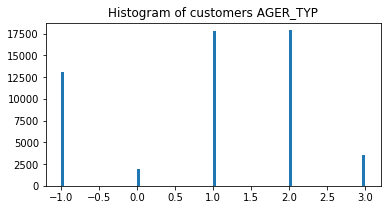

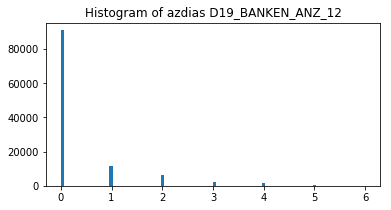

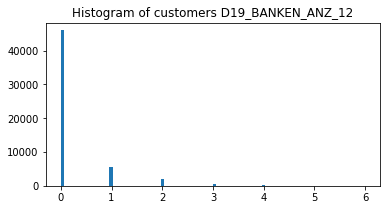

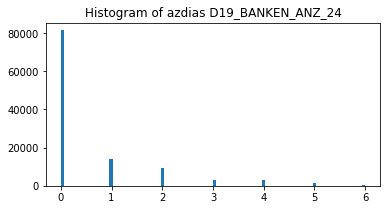

...

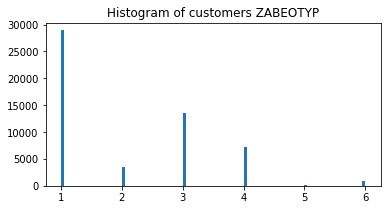

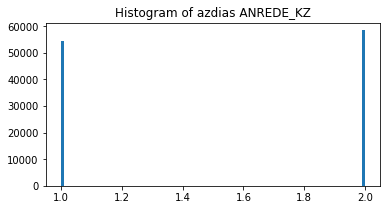

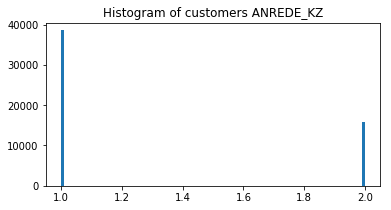

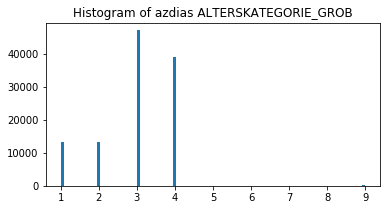

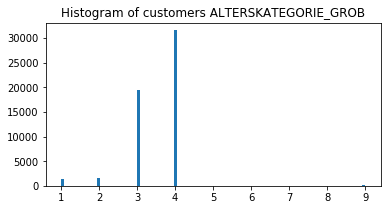

In [17]:
# transportation (to work)
int_features = azdias.select_dtypes(include = 'int').columns
n_bins = 100 # can decrease to get a wider bin (or vice versa)

for column_name in int_features:
    ax=plt.subplots(figsize=(6,3))
    # get data by column_name and display a histogram
    ax = plt.hist(azdias[column_name], bins=n_bins)
    title="Histogram of azdias " + column_name
    plt.title(title, fontsize=12)
    
    ax1 = plt.subplots(figsize=(6,3))
    ax1 = plt.hist(customers[column_name], bins = n_bins)
    title1 = "Histogram of customers " + column_name
    plt.title(title1, fontsize = 12)
    plt.show()

## PCA Analysis

PCA will be used to reduce the dimensionality of the dataset. It does this by using weighted combinations of the features to create these things called principal components that can represent the information in the data while reducing the number of features necessary to represent that information. This is what will be done next. 

Lets generate a PCA Model. We need to find the features that explain most of the variance. 

In [113]:
# scale numerical features into a normalized range, 0-1

from sklearn.preprocessing import MinMaxScaler

scaler=MinMaxScaler()
# store them in this dataframe

azdias_scaled=pd.DataFrame(scaler.fit_transform(azdias.select_dtypes(include = ['float', 'int'])))

customers_scaled = pd.DataFrame(scaler.fit_transform(customers.select_dtypes(include = ['float', 'int'])))

# get features and indices from the original dataframes


azdias_scaled.columns=azdias.select_dtypes(include = ['float','int']).columns
azdias_scaled.index=azdias.select_dtypes(include =  ['float','int']).index

customers_scaled.columns=customers.select_dtypes(include =  ['float','int']).columns
customers_scaled.index=customers.select_dtypes(include =  ['float','int']).index

print(azdias_scaled.head())

print(customers_scaled.head())

    AGER_TYP  D19_BANKEN_ANZ_12  D19_BANKEN_ANZ_24  D19_BANKEN_DATUM  \
5        1.0           0.000000           0.000000          1.000000   
9        0.0           0.000000           0.000000          0.777778   
45       0.5           0.000000           0.000000          1.000000   
79       0.0           0.333333           0.666667          0.000000   
87       0.0           0.000000           0.000000          1.000000   

    D19_BANKEN_DIREKT  D19_BANKEN_GROSS  D19_BANKEN_LOKAL  \
5            0.000000          0.000000               0.0   
9            0.857143          1.000000               0.0   
45           1.000000          0.000000               1.0   
79           0.714286          0.166667               0.0   
87           0.000000          0.000000               0.0   

    D19_BANKEN_OFFLINE_DATUM  D19_BANKEN_ONLINE_DATUM  D19_BANKEN_REST  \
5                        1.0                 1.000000         0.000000   
9                        1.0                 0.77777

In [114]:
from sklearn.decomposition import PCA

pca_azdias = PCA(n_components= 354)

pca_customers = PCA(n_components = 357)

principalComponents_azdias = pca_azdias.fit_transform(azdias_scaled)

principalDf = pd.DataFrame(data = principalComponents_azdias)

principalComponents_customers = pca_customers.fit_transform(customers_scaled)

principalDF2 = pd.DataFrame(data = principalComponents_customers)

In [115]:
principalDf.head()

,0,1,2,3,4,5,6,7,8,9,...,344,345,346,347,348,349,350,351,352,353
0,0.876931,-0.834348,-0.050098,0.883436,2.156053,0.420971,-0.654626,0.313319,0.066928,-0.159861,...,0.010436,-0.004304,0.028397,-0.003274,0.000073,-0.003083,0.000423,-0.009107,-0.003222,0.004134
1,1.037805,0.517266,2.709175,-0.812946,1.411245,1.090488,-0.385339,0.476166,-0.390508,-1.242675,...,-0.026463,0.016837,0.016511,0.008797,-0.002199,0.005141,0.000863,0.006647,-0.006072,0.001549
2,-1.749028,-1.141322,-0.456678,-1.222423,-0.308799,-0.419127,-0.628414,1.472973,-0.511100,0.124274,...,-0.037172,-0.032605,0.030566,0.012902,-0.007014,-0.004790,-0.000791,-0.002422,-0.001862,-0.000026
3,0.876240,3.023129,1.447032,0.919877,-1.201853,-0.832770,-0.368695,0.516144,0.277782,-0.962969,...,0.000819,-0.130774,-0.035515,-0.015681,-0.010565,-0.038166,0.000884,-0.016367,-0.007764,0.001342
4,-0.535664,-0.920029,1.275224,0.992859,0.690153,-0.053961,0.923129,0.623771,-1.011413,0.077280,...,0.030930,0.031419,-0.052021,-0.008996,0.004010,-0.012292,0.001060,-0.025281,0.000478,-0.000151


In [40]:
principalDF2.head()

,0,1,2,3,4,5,6,7,8,9,...,347,348,349,350,351,352,353,354,355,356
0,-0.643609,-0.349368,-1.296567,-0.028406,0.429489,0.357712,-1.541564,0.047736,0.526914,-0.599338,...,0.004243,-0.001176,-0.001373,0.002845,0.001980,0.000573,0.002559,-0.000225,-0.000158,1.099634e-15
1,1.115213,-1.674114,-1.788669,0.141432,0.161167,-0.247413,0.980205,0.487842,0.258334,-0.374484,...,-0.011073,0.001707,0.008365,0.001381,-0.003370,0.000489,0.005562,-0.000358,0.000316,2.970616e-16
2,-0.685138,-0.147121,-0.623261,-0.272016,0.636542,-0.920071,-0.189240,0.935793,1.067653,-0.126540,...,0.000149,0.088357,-0.004059,0.006240,0.000754,0.001858,0.000775,0.001487,-0.000137,-1.134105e-16
3,3.217539,1.597880,0.435322,0.594287,-0.239289,0.467341,-0.743141,0.047626,-0.313911,-0.554101,...,-0.003368,-0.001352,-0.026403,0.000703,0.005822,0.001994,0.022066,-0.004094,-0.001272,-1.286770e-15
4,-0.072486,-1.466713,-0.376781,-0.658032,-0.111053,0.070696,-0.300884,-1.362730,0.288496,-0.300148,...,-0.019413,0.003407,0.014521,0.000728,0.001871,-0.001896,0.002215,0.001397,0.000022,1.016792e-15


In [ ]:
variance_azdias = pca_azdias.explained_variance_ratio_

var=np.cumsum(np.round(pca_azdias.explained_variance_ratio_, decimals=3)*100)
var[180] #cumulative sum of variance explained with [n] features

In [ ]:
plt.ylabel('% Variance Explained')
plt.xlabel('# of components')
plt.title('PCA Analysis')
plt.ylim(30,100.5)
plt.style.context('seaborn-whitegrid')


plt.plot(var)

In [28]:
variance_customers = pca_customers.explained_variance_ratio_

var=np.cumsum(np.round(pca_customers.explained_variance_ratio_, decimals=3)*100)
var[180] #cumulative sum of variance explained with [n] features

93.599999999999994

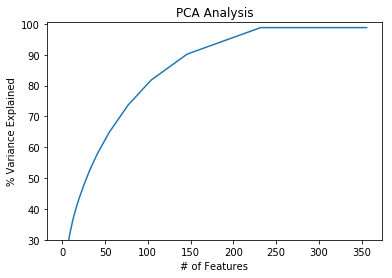

In [29]:
plt.ylabel('% Variance Explained')
plt.xlabel('# of components')
plt.title('PCA Analysis')
plt.ylim(30,100.5)
plt.style.context('seaborn-whitegrid')


plt.plot(var)

So looks like we need the first 180 components as they explain around 93% of the variance. We will choose those features.

In [111]:
import seaborn as sns

def display_component(pca, N_COMPONENTS, features_list, component_num, n_weights=10):
    
    v = pd.DataFrame(pca.components_)
    
    # get index of component (last row - component_num)
    row_idx = N_COMPONENTS-component_num

    # get the list of weights from a row in v, dataframe
    v_1_row = v.iloc[:, row_idx]
    v_1 = np.squeeze(v_1_row.values)

    # match weights to features in counties_scaled dataframe, using list comporehension
    comps = pd.DataFrame(list(zip(v_1, features_list)), 
                         columns=['weights', 'features'])

    # we'll want to sort by the largest n_weights
    # weights can be neg/pos and we'll sort by magnitude
    comps['abs_weights']=comps['weights'].apply(lambda x: np.abs(x))
    sorted_weight_data = comps.sort_values('abs_weights', ascending=False).head(n_weights)

    # display using seaborn
    ax=plt.subplots(figsize=(10,6))
    ax=sns.barplot(data=sorted_weight_data, 
                   x="weights", 
                   y="features", 
                   palette="Blues_d")
    ax.set_title("PCA Component Makeup, Component #" + str(component_num))
    plt.show()


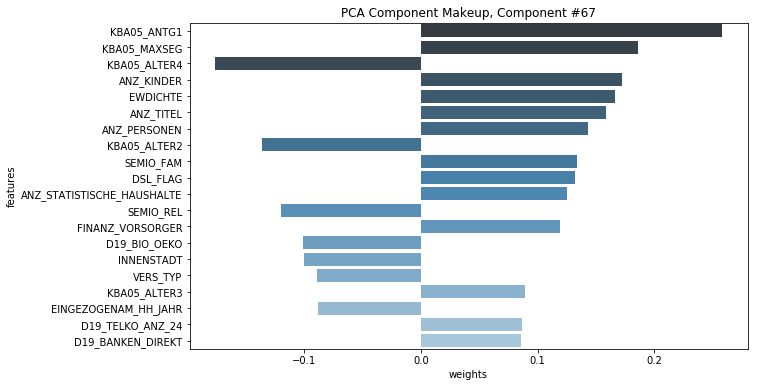

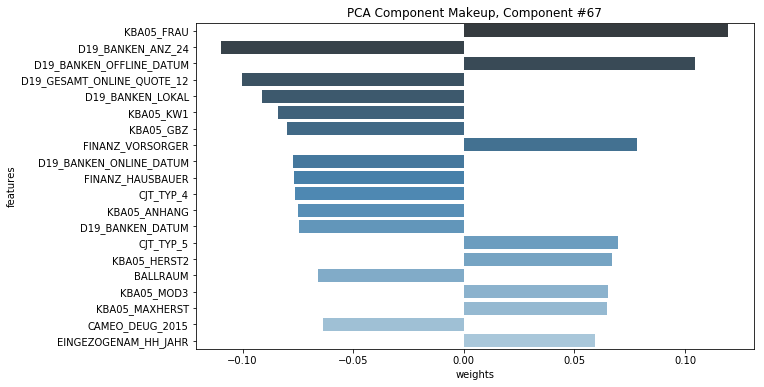

In [105]:
# display makeup of 67th component
num_azdias = 67
num_customers = 67
N_COMPONENTS_AZDIAS = azdias.shape[1]
N_COMPONENTS_CUSTOMERS = customers.shape[1]

display_component(pca_azdias, N_COMPONENTS_AZDIAS, azdias.columns.values, component_num=num_azdias, n_weights=20)

display_component(pca_customers, N_COMPONENTS_CUSTOMERS, customers.columns.values, component_num = num_customers, n_weights = 20 )

In [49]:
#choose the first 180 components from the principal DF and principal DF2

azdias_transformed = principalDf.iloc[:, :180]

customers_transformed = principalDF2.iloc[:, :180]

    

## KMeans Model 

Now we need to define a kmeans model to cluster our datapoints. 

In [50]:
from scipy.spatial.distance import cdist

distortions = [] 
inertias = [] 
mapping1 = {} 
mapping2 = {} 
K = range(1,10) 
  
for k in K: 
    #Building and fitting the model 
    kmeanAzdias = KMeans(n_clusters=k).fit(azdias_transformed) 
    kmeanAzdias.fit(azdias_transformed)     
      
    distortions.append(sum(np.min(cdist(azdias_transformed, kmeanAzdias.cluster_centers_, 
                      'euclidean'),axis=1)) / azdias_transformed.shape[0]) 
    inertias.append(kmeanAzdias.inertia_) 
  
    mapping1[k] = sum(np.min(cdist(azdias_transformed, kmeanAzdias.cluster_centers_, 
                 'euclidean'),axis=1)) / azdias_transformed.shape[0] 
    mapping2[k] = kmeanAzdias.inertia_

In [51]:
for key,val in mapping1.items(): 
    print(str(key)+' : '+str(val)) 

1 : 4.75686878543
2 : 4.62249643644
3 : 4.53234749685
4 : 4.4803359131
5 : 4.44635811742
6 : 4.41942319252
7 : 4.39670433771
8 : 4.37577238059
9 : 4.35771688845


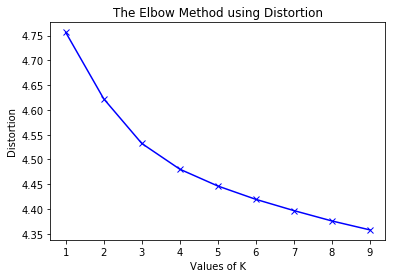

In [52]:
plt.plot(K, distortions, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Distortion') 
plt.title('The Elbow Method using Distortion') 
plt.show()

In [54]:
kmeans_azdias = KMeans(n_clusters = 4)

kmeans_customers = KMeans(n_clusters = 4)

kmeans_azdias.fit(azdias)

kmeans_customers.fit(customers)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [55]:
kmeans_azdias.cluster_centers_

array([[  1.85240370e-01,   3.69122223e-01,   6.02217450e-01, ...,
          1.86232087e+01,   1.11877339e+02,   8.80012270e-01],
       [  2.28390037e-01,   2.68327093e-01,   4.26718758e-01, ...,
          1.93559065e+01,   1.17874111e+02,   8.26035053e-01],
       [ -1.54822855e-01,   4.07741143e-01,   6.65574442e-01, ...,
          1.86031128e+01,   2.10583330e+03,   7.72475937e-01],
       [  2.03486629e-01,   3.63637726e-01,   5.91437822e-01, ...,
          1.88612843e+01,   1.11926685e+02,   7.70925770e-01]])

In [56]:
kmeans_customers.cluster_centers_

array([[ 0.98067434,  0.23499178,  0.37911184, ...,  0.95662007,
         1.02364309,  0.32524671],
       [ 0.81603164,  0.20936953,  0.32222983, ...,  0.94843714,
         0.96950338,  0.27211195],
       [ 1.01563453,  0.23100369,  0.3672679 , ...,  0.9065873 ,
         1.01997346,  0.33585542],
       [ 0.76139948,  0.24749068,  0.40292515, ...,  0.88758245,
         1.05334098,  0.37826212]])

[0 2 2 ..., 2 1 0]


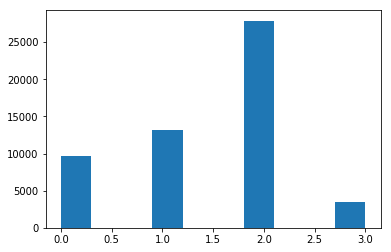

In [57]:
print(kmeans_customers.labels_)

plt.hist(kmeans_customers.labels_)

plt.show()

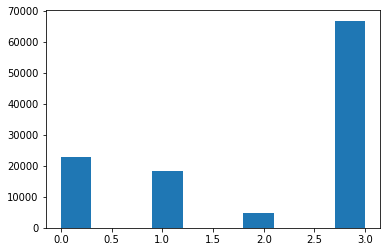

In [58]:
plt.hist(kmeans_azdias.labels_)

plt.show()

All right! We were able to seperate all the people into four groups. It looks like the customers mostly belong to group 3. It will most likely be the best option to target this cluster for the general population. 

## Heatmap for Azdias

### Whole heatmap

In [139]:
cluster_centroids = kmeans_azdias.cluster_centers_

pd_centroids = pd.DataFrame(cluster_centroids.T)

In [144]:
pd_centroids

,0,1,2,3
0,0.185240,0.228390,-0.154823,0.203487
1,0.369122,0.268327,0.407741,0.363638
2,0.602217,0.426719,0.665574,0.591438
3,8.137035,8.470780,7.975630,8.141414
4,1.847758,1.472191,2.020479,1.847794
5,1.189754,0.856585,1.252099,1.199904
6,0.274552,0.230615,0.310670,0.225012
7,9.692625,9.720332,9.705304,9.721010
8,8.613480,8.934234,8.450747,8.614792
9,1.085981,0.829671,1.149703,1.042301


In [140]:
# generate a heatmap in component space, using the seaborn library
x = plt.figure(figsize = (200,150))
ax = sns.heatmap(cluster_centroids.T, cmap = 'YlGnBu')
ax.set_xlabel("Cluster")
plt.yticks(fontsize = 64)
plt.xticks(fontsize = 64)
ax.set_title("Attribute Value by Centroid")
plt.show()

x.savefig("azdiasheatmap.pdf")

Its kind of hard to read the heatmap. Lets break it down. 

In [69]:
# generate a heatmap in component space, using the seaborn library
plt.figure(figsize = (200,150))
ax = sns.heatmap(cluster_centroids.T[0:70,:], cmap = 'YlGnBu')
ax.set_xlabel("Cluster")
plt.yticks(fontsize = 64)
plt.xticks(fontsize = 64)
ax.set_title("Attribute Value by Centroid")
plt.show()

In [83]:
cluster_centroids_2 = pd.DataFrame(cluster_centroids.T).iloc[70:140, :]

In [85]:
# generate a heatmap in component space, using the seaborn library
plt.figure(figsize = (200,150))
ax = sns.heatmap(cluster_centroids_2.values, cmap = 'YlGnBu')
ax.set_xlabel("Cluster")
plt.yticks(fontsize = 64)
plt.xticks(fontsize = 64)
ax.set_title("Attribute Value by Centroid")
plt.show()

In [89]:
cluster_centroids_3 = pd.DataFrame(cluster_centroids.T).iloc[140:210, :] 

In [90]:
# generate a heatmap in component space, using the seaborn library
plt.figure(figsize = (200,150))
ax = sns.heatmap(cluster_centroids_3.values, cmap = 'YlGnBu')
ax.set_xlabel("Cluster")
plt.yticks(fontsize = 64)
plt.xticks(fontsize = 64)
ax.set_title("Attribute Value by Centroid")
plt.show()

In [91]:
cluster_centroids_4 = pd.DataFrame(cluster_centroids.T).iloc[210:280, :]

In [92]:
# generate a heatmap in component space, using the seaborn library
plt.figure(figsize = (200,150))
ax = sns.heatmap(cluster_centroids_4.values, cmap = 'YlGnBu')
ax.set_xlabel("Cluster")
plt.yticks(fontsize = 64)
plt.xticks(fontsize = 64)
ax.set_title("Attribute Value by Centroid")
plt.show()

In [94]:
cluster_centroids_5 = pd.DataFrame(cluster_centroids.T).iloc[280: 350, :]

In [95]:
# generate a heatmap in component space, using the seaborn library
plt.figure(figsize = (200,150))
ax = sns.heatmap(cluster_centroids_5.values, cmap = 'YlGnBu')
ax.set_xlabel("Cluster")
plt.yticks(fontsize = 64)
plt.xticks(fontsize = 64)
ax.set_title("Attribute Value by Centroid")
plt.show()

## Heatmap for customers dataset

In [97]:
cluster_centroids = kmeans_customers.cluster_centers_

pd_centroids = pd.DataFrame(cluster_centroids.T)

In [141]:
# generate a heatmap in component space, using the seaborn library
x = plt.figure(figsize = (200, 150))
ax = sns.heatmap(cluster_centroids.T, cmap = 'YlGnBu')
ax.set_xlabel("Cluster")
plt.yticks(fontsize = 64)
plt.xticks(fontsize = 64)
ax.set_title("Attribute Value by Centroid")
plt.show()
x.savefig('customersheatmap.pdf')

In [98]:
# generate a heatmap in component space, using the seaborn library
plt.figure(figsize = (200, 150))
ax = sns.heatmap(cluster_centroids.T[:70,:], cmap = 'YlGnBu')
ax.set_xlabel("Cluster")
plt.yticks(fontsize = 64)
plt.xticks(fontsize = 64)
ax.set_title("Attribute Value by Centroid")
plt.show()

In [99]:
cluster_centroids_2 = pd.DataFrame(cluster_centroids.T).iloc[70:140, :]

In [100]:
# generate a heatmap in component space, using the seaborn library
plt.figure(figsize = (200, 150))
ax = sns.heatmap(cluster_centroids_2.values, cmap = 'YlGnBu')
ax.set_xlabel("Cluster")
plt.yticks(fontsize = 64)
plt.xticks(fontsize = 64)
ax.set_title("Attribute Value by Centroid")
plt.show()

In [118]:
cluster_centroids_3 = pd.DataFrame(cluster_centroids.T).iloc[140: 210, :]

In [119]:
# generate a heatmap in component space, using the seaborn library
plt.figure(figsize = (200, 150))
ax = sns.heatmap(cluster_centroids_3.values, cmap = 'YlGnBu')
ax.set_xlabel("Cluster")
plt.yticks(fontsize = 64)
plt.xticks(fontsize = 64)
ax.set_title("Attribute Value by Centroid")
plt.show()

In [105]:
cluster_centroids_4 = pd.DataFrame(cluster_centroids.T).iloc[210: 280, :]

In [106]:
# generate a heatmap in component space, using the seaborn library
plt.figure(figsize = (200, 150))
ax = sns.heatmap(cluster_centroids_4.values, cmap = 'YlGnBu')
ax.set_xlabel("Cluster")
plt.yticks(fontsize = 64)
plt.xticks(fontsize = 64)
ax.set_title("Attribute Value by Centroid")
plt.show()

In [108]:
cluster_centroids_5 = pd.DataFrame(cluster_centroids.T).iloc[280: 350, :]

In [109]:
# generate a heatmap in component space, using the seaborn library
plt.figure(figsize = (200, 150))
ax = sns.heatmap(cluster_centroids_5.values, cmap = 'YlGnBu')
ax.set_xlabel("Cluster")
plt.yticks(fontsize = 64)
plt.xticks(fontsize = 64)
ax.set_title("Attribute Value by Centroid")
plt.show()

## PCA component makeup

Now it is time to identify the features that are used in the components with the highest correlation. 

### pca component makeup for azdias

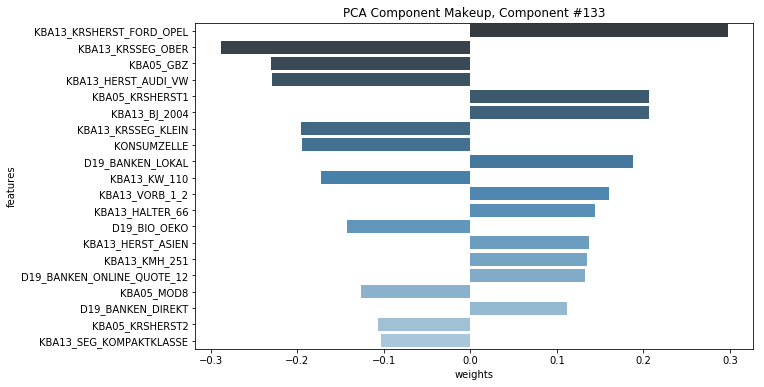

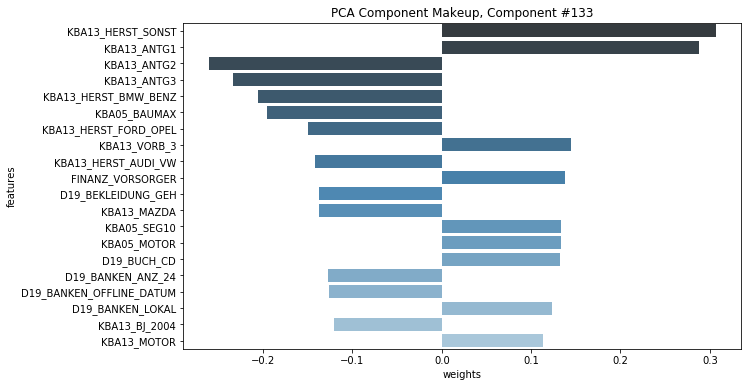

In [138]:
# display makeup of components. I see three components that are correlated with being part of cluster 3. These are components 245, 133 and 67
num_azdias = 133
num_customers = 133
N_COMPONENTS_AZDIAS = azdias_transformed.shape[1]
N_COMPONENTS_CUSTOMERS = customers_transformed.shape[1]

display_component(pca_azdias, N_COMPONENTS_AZDIAS, azdias.columns.values, component_num=num_azdias, n_weights=20)

display_component(pca_customers, N_COMPONENTS_CUSTOMERS, customers.columns.values, component_num = num_customers, n_weights = 20 )

## Investigate natural groupings for azdias

In [122]:
# add a 'labels' column to the dataframe
azdias_transformed['labels']=list(map(int, kmeans_azdias.labels_))

# sort by cluster label 0-3
sorted_azdias = azdias_transformed.sort_values('labels', ascending=True)
# view some pts in cluster 0
sorted_azdias.head(20)

,0,1,2,3,4,5,6,7,8,9,...,171,172,173,174,175,176,177,178,179,labels
0,0.876931,-0.834348,-0.050098,0.883436,2.156053,0.420971,-0.654626,0.313319,0.066928,-0.159861,...,0.031718,0.123563,0.404520,-0.151949,-0.233880,-0.419340,0.186741,0.142248,0.210856,0
50012,-1.566492,0.753922,-0.579381,-0.535064,1.528989,-0.346340,-0.678449,0.561473,0.609157,-1.102728,...,0.136688,0.089736,0.046143,0.206336,-0.012702,-0.091618,-0.047953,0.032108,0.158657,0
50014,0.192823,-0.975142,0.728719,-1.143179,0.564110,-0.645837,-0.750618,-1.225956,0.270102,-0.686465,...,-0.101892,0.029655,0.055837,-0.010066,0.222112,-0.083253,-0.707129,-0.212722,-0.352896,0
50024,-0.340227,-1.860987,0.332529,1.104854,-0.109967,-0.984618,-1.107125,-0.018128,-0.699278,-0.683248,...,-0.136924,-0.120162,0.084427,-0.157041,0.037438,0.061623,0.123064,-0.237623,-0.257629,0
50032,-1.859626,0.206286,-0.117474,0.543060,0.600108,-0.577869,-1.632392,0.064704,-0.053515,0.177033,...,-0.139979,-0.162494,-0.447691,-0.005689,0.107376,-0.073290,0.080529,-0.306488,0.064733,0
50041,-1.410958,0.624322,3.423450,1.158393,-0.554082,0.997138,-0.293727,0.500249,-0.487337,-0.432383,...,-0.035686,-0.080040,-0.108787,-0.089124,0.001763,0.057062,0.039393,-0.064309,0.065714,0
50045,1.307839,-1.444182,0.453061,-0.319853,0.740983,-0.632062,0.272859,1.999033,-0.029462,0.175622,...,-0.033025,-0.056152,0.086917,-0.156580,0.219199,0.072401,0.019189,0.009831,0.367384,0
50006,-0.458494,-0.204392,1.014659,-0.958933,0.035998,-0.081551,-1.245700,-0.193738,-0.387358,-0.034206,...,0.012867,-0.133604,0.356141,-0.133545,0.063687,0.091392,-0.113105,-0.122620,-0.003209,0
50067,0.407372,-0.013931,-0.160970,0.818716,0.417296,-0.447069,-1.139272,-0.147067,-1.092280,-0.054296,...,0.289016,-0.173119,0.050628,-0.156962,0.080276,0.146868,-0.097682,0.193452,0.055283,0
50075,1.089774,2.848185,0.733008,-0.031487,0.628745,-0.253471,-0.223437,0.100655,0.235656,0.043755,...,0.116296,-0.293081,-0.260908,-0.056277,0.090000,0.124344,0.102017,0.235857,0.073508,0


In [130]:
# see what groupings there are

num = 3

sorted_azdias[sorted_azdias['labels'] == num]

,0,1,2,3,4,5,6,7,8,9,...,171,172,173,174,175,176,177,178,179,labels
91207,3.363474,-0.645457,-0.040178,0.302763,-0.480635,-0.449844,-0.409274,-0.480733,0.954193,-0.564927,...,-0.214796,0.036422,0.031672,0.015364,-0.126853,-0.109612,-0.090950,-0.071923,-0.069097,3
88136,-0.888828,2.101169,0.166965,-1.027821,-0.706648,-1.457711,0.332817,-0.644933,-0.892904,-0.727897,...,-0.091450,0.271370,0.152021,0.051507,-0.124411,0.088996,-0.135784,0.201933,-0.049512,3
91782,-1.069318,-0.806910,-0.264792,0.483223,-0.928696,-1.003097,-1.126843,0.856678,0.185097,-0.309059,...,-0.032584,0.192495,-0.071978,-0.312687,0.046085,-0.010671,0.066687,-0.316136,0.145409,3
24992,-1.089510,-0.800625,-1.296637,-1.011912,0.262012,-0.179828,-0.335074,-0.598321,1.274353,-0.435271,...,0.165502,0.032447,0.005405,-0.124593,-0.053904,0.063298,-0.080897,-0.024241,0.105808,3
92811,-1.351877,1.570171,1.408826,-0.571666,0.690962,-0.118821,-0.372318,-0.618684,-0.434313,-0.622288,...,-0.187804,-0.065369,0.127962,-0.244522,0.298420,-0.026397,-0.039619,0.210650,-0.084939,3
92743,-0.252256,0.610173,2.569532,0.790462,-0.178635,1.130286,1.029096,0.709610,0.297629,-0.131047,...,0.053517,0.102386,0.379793,-0.100170,0.158011,0.041070,0.033549,0.313420,-0.146586,3
92812,0.538195,2.744552,-0.525673,1.443207,0.024388,-1.385813,0.121624,-0.436276,-0.084096,-0.106710,...,-0.157678,-0.242326,0.071094,-0.208139,0.100687,0.242071,0.086339,0.192543,0.069831,3
17693,-0.616725,0.749967,-0.040543,-0.181345,1.464425,0.838509,-0.260107,-0.572720,0.091286,0.069926,...,-0.071391,0.102954,-0.114972,-0.050035,0.166644,-0.113668,-0.119213,0.018920,-0.034268,3
91339,-0.756271,-0.137373,0.643551,-0.892048,-0.622756,0.107327,0.828119,-0.573275,-0.824073,-0.273623,...,-0.011202,0.290211,-0.004492,-0.254751,0.249457,-0.199053,0.151326,0.039166,0.006082,3
91861,-1.719464,1.325186,-1.629896,-0.717731,0.408814,-0.322213,-0.604819,-0.580923,1.089418,0.137858,...,-0.154655,0.002279,0.168529,0.005936,0.165773,-0.020451,-0.291536,0.371928,0.053019,3


In [126]:
# add a 'labels' column to the dataframe
customers_transformed['labels']=list(map(int, kmeans_customers.labels_))

# sort by cluster label 0-3
sorted_customers = customers_transformed.sort_values('labels', ascending=True)
# view some pts in cluster 0
sorted_customers.head(20)

,0,1,2,3,4,5,6,7,8,9,...,171,172,173,174,175,176,177,178,179,labels
0,-0.643609,-0.349368,-1.296567,-0.028406,0.429489,0.357712,-1.541564,0.047736,0.526914,-0.599338,...,0.327191,-0.093432,-0.222384,-0.062970,0.078551,0.000858,-0.070364,0.043992,-0.121926,0
23521,-2.271632,0.159340,0.661008,-0.794956,-0.591183,-0.322111,0.133998,0.033969,0.221614,0.192192,...,-0.181721,0.083840,-0.056316,0.174959,-0.061953,0.107095,0.170875,0.035531,0.192938,0
23522,-2.568324,0.109121,0.631929,-0.054431,-0.051369,0.402995,0.456092,0.507068,0.489559,0.091561,...,0.220011,0.066084,0.680137,-0.081322,-0.286968,-0.035984,-0.081763,0.071798,0.049473,0
23529,0.016632,1.199484,-0.930161,1.122270,-0.462810,1.050230,-0.916505,-0.526129,0.387698,-0.523714,...,0.106065,0.063185,-0.108510,-0.230192,-0.077524,-0.289904,0.050955,-0.155092,-0.171723,0
23530,-0.334785,-0.604091,-1.825426,-0.558397,-0.092258,0.277154,-0.584948,-0.551954,1.107731,-0.462428,...,-0.133055,0.000668,-0.054994,-0.011037,0.231449,-0.032546,-0.129189,0.066582,0.129135,0
23533,0.922075,-2.595142,0.849503,-0.216389,0.261389,0.302826,-0.392774,0.031603,-0.710481,0.688527,...,-0.073377,0.111450,-0.205028,-0.177875,-0.154722,0.083928,-0.175088,-0.084942,0.261186,0
23538,-0.465336,-0.193113,-0.665702,-0.273675,-0.022223,-1.137796,-0.604752,-0.199951,-0.980233,-0.051680,...,-0.033549,-0.020741,-0.038062,0.044468,0.331644,0.136398,0.024900,0.015220,0.216139,0
23546,-0.561322,-1.878345,-0.382198,-0.075134,0.402173,0.112827,-0.049307,0.355609,-0.651834,-0.047603,...,-0.113208,-0.028292,-0.055233,0.042291,0.113109,-0.142420,0.010723,-0.118965,-0.087027,0
23554,-0.835686,-0.504283,0.041965,-0.046111,1.327206,-0.480827,0.484742,-0.605001,0.169057,-0.433351,...,-0.120163,0.076232,0.079464,0.072320,-0.069925,0.166765,-0.115167,0.115258,0.100262,0
23558,-1.132155,0.330675,-0.679247,0.550590,0.815817,1.213747,1.232190,-0.848052,0.104400,-0.585083,...,0.093020,0.317512,-0.139764,0.472199,-0.044182,-0.066171,-0.005668,0.262114,0.039516,0


In [137]:
num = 3

means = sorted_customers[sorted_customers['labels'] == num].mean()

means = means.drop('labels')

means

0     -0.600223
1      0.119675
2      0.056298
3      0.220603
4      0.160333
5      0.029752
6      0.051873
7     -0.037872
8      0.128397
9     -0.056781
10     0.028950
11    -0.010117
12     0.041530
13    -0.079925
14     0.022951
15     0.017743
16     0.002132
17    -0.066529
18     0.012388
19     0.117678
20     0.082946
21    -0.084363
22    -0.065875
23     0.065673
24    -0.095780
25     0.045907
26     0.012836
27    -0.028809
28     0.025537
29    -0.050295
         ...   
150   -0.004956
151    0.011119
152    0.007661
153   -0.003891
154    0.018533
155    0.008923
156    0.007150
157   -0.015925
158   -0.002285
159   -0.013289
160   -0.006300
161   -0.010557
162   -0.012229
163    0.001132
164    0.007391
165   -0.001610
166    0.005364
167   -0.012342
168    0.003749
169    0.018000
170   -0.002354
171   -0.015904
172    0.001537
173    0.016181
174   -0.050963
175    0.001833
176   -0.006123
177    0.010621
178   -0.021573
179   -0.002842
Length: 180, dtype: floa

## Part 2: Supervised Learning Model

Now that you've found which parts of the population are more likely to be customers of the mail-order company, it's time to build a prediction model. Each of the rows in the "MAILOUT" data files represents an individual that was targeted for a mailout campaign. Ideally, we should be able to use the demographic information from each individual to decide whether or not it will be worth it to include that person in the campaign.

The "MAILOUT" data has been split into two approximately equal parts, each with almost 43 000 data rows. In this part, you can verify your model with the "TRAIN" partition, which includes a column, "RESPONSE", that states whether or not a person became a customer of the company following the campaign. In the next part, you'll need to create predictions on the "TEST" partition, where the "RESPONSE" column has been withheld.

In [12]:
mailout_train = pd.read_csv('../../data/Term2/capstone/arvato_data/Udacity_MAILOUT_052018_TRAIN.csv', sep=';')

/opt/conda/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (18,19) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [13]:
mailout_train_original = mailout_train 

In [5]:
mailout_train.head()

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,...,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,RESPONSE,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,1763,2,1.0,8.0,NaN,NaN,NaN,NaN,8.0,15.0,...,5.0,2.0,1.0,6.0,9.0,3.0,3,0,2,4
1,1771,1,4.0,13.0,NaN,NaN,NaN,NaN,13.0,1.0,...,1.0,2.0,1.0,4.0,9.0,7.0,1,0,2,3
2,1776,1,1.0,9.0,NaN,NaN,NaN,NaN,7.0,0.0,...,6.0,4.0,2.0,NaN,9.0,2.0,3,0,1,4
3,1460,2,1.0,6.0,NaN,NaN,NaN,NaN,6.0,4.0,...,8.0,11.0,11.0,6.0,9.0,1.0,3,0,2,4
4,1783,2,1.0,9.0,NaN,NaN,NaN,NaN,9.0,53.0,...,2.0,2.0,1.0,6.0,9.0,3.0,3,0,1,3


In [5]:
class_0 = mailout_train[mailout_train['RESPONSE'] == 0]

class_1 = mailout_train[mailout_train['RESPONSE'] == 1]

Class Imbalance found. Randomly sample same amount of elements as class_1 from class_0. 

In [6]:
class_0.shape

(42430, 367)

In [7]:
class_1.shape

(532, 367)

Class Imbalance found. Randomly sample same amount of elements as class_1 from class_0. 

In [8]:
class_1 = class_1.sample(n = 42430, replace = True, random_state = 1)

In [9]:
class_1.shape

(42430, 367)

In [10]:
mailout_train = pd.concat([class_0, class_1])

In [14]:
mailout_train_response = mailout_train.loc[:, 'RESPONSE']

mailout_train = mailout_train.fillna(-1)

mailout_train = mailout_train.select_dtypes(exclude = 'object')

absCorrWithDep = []

for column in mailout_train.columns:
    absCorrWithDep.append(abs(mailout_train_response.corr(mailout_train[column])))

    

In [21]:
corr = pd.DataFrame(absCorrWithDep)

corr.columns = ['Correlation']

corr[corr['Correlation'] > .02]

,Correlation
54,0.027145
55,0.040392
65,0.026575
324,0.030111
358,1.000000


In [26]:
#These are the features that correlate the most with the response variable. 
# 'D19_BANKEN_DIREKT','D19_KONSUMTYP', 'D19_KONSUMTYP_MAX', 'D19_SOZIALES', 'FINANZ_VORSORGER', 'RT_KEIN_ANREIZ','RT_SCHNAEPPCHEN' 
mailout_train_sub = mailout_train.iloc[:, [324]]

mailout_train_sub.head(6)

,RT_SCHNAEPPCHEN
0,5.0
1,1.0
2,5.0
3,5.0
4,5.0
5,5.0


In [27]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

# Create an SelectKBest object to select features with two best ANOVA F-Values
fvalue_selector = SelectKBest(f_classif, k=6)

#choose only features

mailout_train_feature_select = mailout_train.drop(columns = ['LNR', 'RESPONSE'])
# Apply the SelectKBest object to the features and target
X_kbest = fvalue_selector.fit_transform(mailout_train_feature_select, mailout_train_response)

X_kbest = pd.DataFrame(X_kbest)

X_kbest.columns = ['D19_BANKEN_DIREKT', 'D19_KONSUMTYP', 'D19_KONSUMTYP_MAX', 'D19_SOZIALES', 'FINANZ_VORSORGER', 'RT_SCHNAEPPCHEN']

X_kbest


,D19_BANKEN_DIREKT,D19_KONSUMTYP,D19_KONSUMTYP_MAX,D19_SOZIALES,FINANZ_VORSORGER,RT_SCHNAEPPCHEN
0,3.0,2.0,1.0,3.0,2.0,5.0
1,1.0,4.0,5.0,1.0,3.0,1.0
2,2.0,2.0,2.0,1.0,1.0,5.0
3,3.0,2.0,1.0,4.0,2.0,5.0
4,2.0,2.0,1.0,0.0,1.0,5.0
5,1.0,3.0,3.0,0.0,1.0,5.0
6,3.0,8.0,3.0,2.0,3.0,2.0
7,9.0,8.0,4.0,2.0,3.0,3.0
8,-1.0,9.0,-1.0,-1.0,4.0,5.0
9,-1.0,9.0,-1.0,-1.0,4.0,5.0


In [28]:
mailout_train = mailout_train.loc[:, ['D19_BANKEN_DIREKT', 'D19_KONSUMTYP', 'D19_KONSUMTYP_MAX', 'D19_SOZIALES', 'FINANZ_VORSORGER', 'RT_SCHNAEPPCHEN']]

In [29]:
mailout_train_response.head()

0    0
1    0
2    0
3    0
4    0
Name: RESPONSE, dtype: int64

In [30]:
# scale numerical features into a normalized range, 0-1

from sklearn.preprocessing import MinMaxScaler

scaler=MinMaxScaler()
# store them in this dataframe

mailout_train_scaled =pd.DataFrame(scaler.fit_transform(mailout_train))


# get same features and State-County indices


mailout_train_scaled.columns=mailout_train.columns
mailout_train_scaled.index=mailout_train.index


In [31]:
mailout_train_response = pd.DataFrame(mailout_train_response)

mailout_train_response.columns = ['RESPONSE']

In [32]:
mailout_train_scaled

,D19_BANKEN_DIREKT,D19_KONSUMTYP,D19_KONSUMTYP_MAX,D19_SOZIALES,FINANZ_VORSORGER,RT_SCHNAEPPCHEN
0,0.000000,0.4,0.125,0.333333,1.00,1.000000
1,0.000000,0.2,0.375,1.000000,1.00,0.333333
2,0.000000,0.3,0.125,0.500000,0.75,1.000000
3,0.000000,0.4,0.125,0.333333,1.00,1.000000
4,0.000000,0.3,0.125,0.333333,1.00,1.000000
5,0.571429,0.2,0.250,0.666667,1.00,1.000000
6,0.000000,0.4,0.875,0.666667,1.00,0.500000
7,0.857143,1.0,0.875,0.833333,1.00,0.666667
8,0.000000,0.0,1.000,0.000000,0.50,1.000000
9,0.000000,0.0,1.000,0.000000,0.50,1.000000


In [33]:
mailout_train = pd.concat([mailout_train_scaled, mailout_train_response], axis = 1)

mailout_train = mailout_train.fillna(-1)

In [34]:
mailout_train.shape[1]

7

In [35]:
X = mailout_train.iloc[:, 0:6]

y = mailout_train.iloc[:, 6 ]

X = X.values 

y = np.array(y).reshape(y.shape[0],1)


In [36]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state = 12)

X, y = sm.fit_sample(X, y.ravel())

Using TensorFlow backend.


In [37]:
X.shape

(84860, 6)

In [38]:
y = np.array(y).reshape(y.shape[0],1)

y.shape

(84860, 1)

## Pytorch Model

In [191]:
# torch imports
import torch.nn.functional as F
import torch.nn as nn


## TODO: Complete this classifier
class BinaryClassifier(nn.Module):
    """
    Define a neural network that performs binary classification.
    The network should accept your number of features as input, and produce 
    a single sigmoid value, that can be rounded to a label: 0 or 1, as output.
    
    Notes on training:
    To train a binary classifier in PyTorch, use BCELoss.
    BCELoss is binary cross entropy loss, documentation: https://pytorch.org/docs/stable/nn.html#torch.nn.BCELoss
    """

    ## TODO: Define the init function, the input params are required (for loading code in train.py to work)
    def __init__(self, input_features, hidden_dim, output_dim):
        """
        Initialize the model by setting up linear layers.
        Use the input parameters to help define the layers of your model.
        :param input_features: the number of input features in your training/test data
        :param hidden_dim: helps define the number of nodes in the hidden layer(s)
        :param output_dim: the number of outputs you want to produce
        """
        super(BinaryClassifier, self).__init__()

        # define any initial layers, here
        
        self.fc1 = nn.Linear(input_features, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim*2)
        self.fc3 = nn.Linear(hidden_dim*2, hidden_dim)
        self.fc4 = nn.Linear(hidden_dim, output_dim)
        #self.fc5 = nn.Linear(hidden_dim, hidden_dim*2)
        #self.fc6 = nn.Linear(hidden_dim*2, output_dim)
       #self.fc5 = nn.Linear(hidden_dim*2, hidden_dim*2)
       # self.fc6 = nn.Linear(hidden_dim * 2, output_dim)
        self.drop = nn.Dropout(0.5)
        self.sigmoid = nn.Sigmoid()
        

    
    ## TODO: Define the feedforward behavior of the network
    def forward(self, x):
        """
        Perform a forward pass of our model on input features, x.
        :param x: A batch of input features of size (batch_size, input_features)
        :return: A single, sigmoid-activated value as output
        """
        
        # define the feedforward behavior
        
        out = F.relu(self.fc1(x))
        #out = self.drop(out)
        out = F.relu(self.fc2(out))
        #out = self.drop(out)
        out = F.relu(self.fc3(out))
        #out = F.relu(self.fc4(out))
        #out = F.relu(self.fc5(out))
        out = self.drop(out)
        out = self.fc4(out)
        #out = F.relu(self.fc5(out))
        #out = self.drop(out)
        #out = self.fc3(out)
        return self.sigmoid(out)
    
    def predict(x, model):
        model.eval() 

        out = model(x)

        out_label = out.cpu().detach().numpy()
        out_label = out_np.round()

        return out_label

## Training

In [192]:
import torch
import torch.optim as optim
import torch.utils.data
import torch.nn as nn

#train_loader = torch.utils.data.DataLoader(X, batch_size = 8, shuffle = True)

X = torch.from_numpy(X).type(torch.FloatTensor)

y = torch.from_numpy(y).type(torch.FloatTensor)


TypeError: expected np.ndarray (got Tensor)

In [193]:
X.shape

torch.Size([84860, 6])

In [194]:
y.shape

torch.Size([84860, 1])

In [275]:
model = BinaryClassifier(6, 24, 1)

#Define loss criterion
criterion = nn.BCELoss()

#define optimizer
optimizer = torch.optim.Adam(model.parameters(), lr = .00095)

print(model)

BinaryClassifier(
  (fc1): Linear(in_features=6, out_features=24, bias=True)
  (fc2): Linear(in_features=24, out_features=48, bias=True)
  (fc3): Linear(in_features=48, out_features=24, bias=True)
  (fc4): Linear(in_features=24, out_features=1, bias=True)
  (drop): Dropout(p=0.5)
  (sigmoid): Sigmoid()
)


In [276]:
from torch.autograd import Variable

def train_epoch(model, epochs, opt, criterion):
    model.train()
    losses = []
    loss_min = np.Inf
    #for index in range(0, X.size(0), batch_size):
    for epoch in range(epochs):
        #x_batch = X[index:index + batch_size, :]
        #y_batch = y[index:index + batch_size, :]
        
        x_batch = Variable(X)
        y_batch = Variable(y)
        
        opt.zero_grad()
        #forward 
        y_pred = model(x_batch)
        
        #compute the difference between predicted and true
        loss = criterion(y_pred, y_batch)
        
        #compute the gradients and see which direction the weights need to be going
        loss.backward()
        
        # update the weights 
        opt.step()
        losses.append(loss.data.numpy())
        
    
     # save model if loss has decreased
        if loss <= loss_min:
            print(' loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(loss_min, loss))
      
      
            model_save_name = 'model.pth'
      
      
            loss_min = loss
            torch.save(model.state_dict(), '/model.pth')
      
            model.epochs = epochs
            model.train_loss = loss
            model.optimizer = optimizer
            model.criterion = criterion
    return losses

In [207]:
path = "/model.pth"

def load_checkpoint(checkpoint_path):
    
    checkpoint = torch.load(checkpoint_path) 
    
    
    
    model = checkpoint['model']
    model.epochs = checkpoint['epochs']
    model.train_loss = checkpoint['train_loss']  
    model.load_state_dict(checkpoint['state_dict'])
    model.optimizer.load_state_dict(checkpoint['optimizer'])                       
    model.criterion.load_state_dict(checkpoint['criterion'])  
    model.eval() 
    
    return model
  
model1 = load_checkpoint(path)

 loss decreased (inf --> 0.694035).  Saving model ...
 loss decreased (0.694035 --> 0.693614).  Saving model ...
 loss decreased (0.693614 --> 0.693271).  Saving model ...
 loss decreased (0.693271 --> 0.692874).  Saving model ...
 loss decreased (0.692874 --> 0.692635).  Saving model ...
 loss decreased (0.692635 --> 0.692330).  Saving model ...
 loss decreased (0.692330 --> 0.691973).  Saving model ...
 loss decreased (0.691973 --> 0.691682).  Saving model ...
 loss decreased (0.691682 --> 0.691443).  Saving model ...
 loss decreased (0.691443 --> 0.690977).  Saving model ...
 loss decreased (0.690977 --> 0.690889).  Saving model ...
 loss decreased (0.690889 --> 0.690416).  Saving model ...
 loss decreased (0.690416 --> 0.690124).  Saving model ...
 loss decreased (0.690124 --> 0.689839).  Saving model ...
 loss decreased (0.689839 --> 0.689411).  Saving model ...
 loss decreased (0.689411 --> 0.689217).  Saving model ...
 loss decreased (0.689217 --> 0.688801).  Saving model ...
 l

 loss decreased (0.596456 --> 0.596174).  Saving model ...
 loss decreased (0.596174 --> 0.595592).  Saving model ...
 loss decreased (0.595592 --> 0.595506).  Saving model ...
 loss decreased (0.595506 --> 0.594963).  Saving model ...
 loss decreased (0.594963 --> 0.594172).  Saving model ...
 loss decreased (0.594172 --> 0.594089).  Saving model ...
 loss decreased (0.594089 --> 0.592939).  Saving model ...
 loss decreased (0.592939 --> 0.591834).  Saving model ...
 loss decreased (0.591834 --> 0.591308).  Saving model ...
 loss decreased (0.591308 --> 0.590246).  Saving model ...
 loss decreased (0.590246 --> 0.589481).  Saving model ...
 loss decreased (0.589481 --> 0.588876).  Saving model ...
 loss decreased (0.588876 --> 0.588282).  Saving model ...
 loss decreased (0.588282 --> 0.587837).  Saving model ...
 loss decreased (0.587837 --> 0.586831).  Saving model ...
 loss decreased (0.586831 --> 0.585764).  Saving model ...
 loss decreased (0.585764 --> 0.585469).  Saving model .

 loss decreased (0.533666 --> 0.533658).  Saving model ...
 loss decreased (0.533658 --> 0.533080).  Saving model ...
 loss decreased (0.533080 --> 0.532654).  Saving model ...
 loss decreased (0.532654 --> 0.532405).  Saving model ...
 loss decreased (0.532405 --> 0.532310).  Saving model ...
 loss decreased (0.532310 --> 0.532180).  Saving model ...
 loss decreased (0.532180 --> 0.531499).  Saving model ...
 loss decreased (0.531499 --> 0.531453).  Saving model ...
 loss decreased (0.531453 --> 0.530235).  Saving model ...
 loss decreased (0.530235 --> 0.529720).  Saving model ...
 loss decreased (0.529720 --> 0.529448).  Saving model ...
 loss decreased (0.529448 --> 0.529443).  Saving model ...
 loss decreased (0.529443 --> 0.528698).  Saving model ...
 loss decreased (0.528698 --> 0.527590).  Saving model ...
 loss decreased (0.527590 --> 0.527210).  Saving model ...
 loss decreased (0.527210 --> 0.526893).  Saving model ...
 loss decreased (0.526893 --> 0.526742).  Saving model .

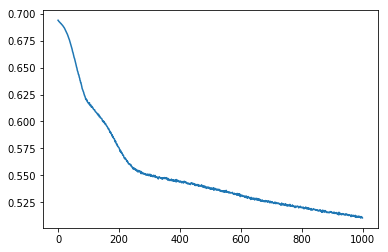

In [277]:
losses = []
#num_epochs = 2000 # 2000 originally
#for e in range(num_epochs):
#    losses += train_epoch(model, optimizer, criterion)
#    print('epoch: ' + str(e))

losses += train_epoch(model, 1000, optimizer, criterion)

print('epoch: ' + str(e))
plt.plot(losses)


array(0.5104705691337585, dtype=float32)

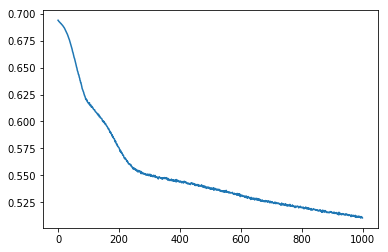

In [278]:
plt.plot(losses)
losses[-1]

In [279]:
checkpoint = {'model': model,            
              'state_dict': model.state_dict(), 
              'epochs' : model.epochs, 
              'optimizer': model.optimizer.state_dict(),
              'train_loss': model.train_loss,
              'criterion': model.criterion.state_dict()}

torch.save(checkpoint, '/model.pth')

/opt/conda/lib/python3.6/site-packages/torch/serialization.py:193: UserWarning: Couldn't retrieve source code for container of type BinaryClassifier. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [281]:
from sklearn.metrics import accuracy_score, auc, roc_curve

model.eval()

out = model(X)

out_np = out.cpu().detach().numpy()
out_label = out_np.round()

In [282]:
pd.DataFrame(out_np)[out_np > .5]


,0
0,0.754068
3,0.754068
4,0.763330
24,0.762216
29,0.754068
30,0.754068
34,0.740836
35,0.693218
36,0.762216
42,0.714180


In [283]:
fpr, tpr, threshold = roc_curve(y, out_label, pos_label= 1)
roc_auc = auc(fpr, tpr)
print(roc_auc)

0.752698562338


In [284]:
from sklearn.metrics import recall_score

recall_score(y, out_label, average = "macro")

0.75269856233796839

## SKLearn Model

I decided to try four models for the SKLearn Portion of the model training. I chose a decision tree classifier and Random Forest. I found out through some searching that trees handle class imbalances well so I will train those with the full dataset. The others will be using the modified dataset. 

In [285]:
mailout_train_original = mailout_train_original.fillna(-1)

mailout_train_original_response = mailout_train_original.loc[:, 'RESPONSE']

mailout_train_original = mailout_train_original.loc[:, ['D19_BANKEN_DIREKT', 'D19_KONSUMTYP', 'D19_KONSUMTYP_MAX', 'D19_SOZIALES', 'FINANZ_VORSORGER', 'RT_SCHNAEPPCHEN']]


In [286]:
# scale numerical features into a normalized range, 0-1

from sklearn.preprocessing import MinMaxScaler

scaler=MinMaxScaler()
# store them in this dataframe

mailout_train_original_scaled =pd.DataFrame(scaler.fit_transform(mailout_train_original))


# get same features and State-County indices


mailout_train_original_scaled.columns=mailout_train_original.columns
mailout_train_original_scaled.index=mailout_train_original.index

In [287]:
mailout_train_original = pd.concat([mailout_train_original_scaled, mailout_train_original_response], axis = 1)

In [288]:
mailout_train_original.head()

,D19_BANKEN_DIREKT,D19_KONSUMTYP,D19_KONSUMTYP_MAX,D19_SOZIALES,FINANZ_VORSORGER,RT_SCHNAEPPCHEN,RESPONSE
0,0.0,0.4,0.125,0.333333,1.00,1.000000,0
1,0.0,0.2,0.375,1.000000,1.00,0.333333,0
2,0.0,0.3,0.125,0.500000,0.75,1.000000,0
3,0.0,0.4,0.125,0.333333,1.00,1.000000,0
4,0.0,0.3,0.125,0.333333,1.00,1.000000,0


In [289]:
X_original = mailout_train_original.iloc[:, 0:6]

y_original = mailout_train_original.iloc[:, 6]

X_original = X_original.values 

y_original = np.array(y_original).reshape(y_original.shape[0],1)

In [290]:
y_original.shape

(42962, 1)

In [291]:
X_original

array([[ 0.        ,  0.4       ,  0.125     ,  0.33333333,  1.        ,
         1.        ],
       [ 0.        ,  0.2       ,  0.375     ,  1.        ,  1.        ,
         0.33333333],
       [ 0.        ,  0.3       ,  0.125     ,  0.5       ,  0.75      ,
         1.        ],
       ..., 
       [ 0.        ,  0.3       ,  0.125     ,  0.33333333,  1.        ,
         1.        ],
       [ 0.71428571,  0.5       ,  0.        ,  0.16666667,  1.        ,
         0.5       ],
       [ 0.        ,  1.        ,  0.875     ,  0.16666667,  1.        ,
         0.83333333]])

In [292]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state = 12)

X_original, y_original = sm.fit_sample(X_original, y_original.ravel())


In [293]:
X_original = pd.DataFrame(X_original)

X_original.columns = mailout_train.iloc[:, :6].columns

X_original = X_original.values

In [294]:
y_original = pd.DataFrame(y_original)

y_original.columns = ['RESPONSE']

y_original = y_original.values

In [295]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
#import xgboost
#from xgboost import XGBClassifier
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression

model1 = DecisionTreeClassifier(max_depth = 6)

model1.fit(X_original, y_original.ravel())


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=6, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [296]:
model2 = LogisticRegression(random_state = 0)

model2.fit(X_original,y_original.ravel())

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=0, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [297]:
model3 = RandomForestClassifier(max_depth = 6)

model3.fit(X_original, y_original.ravel())

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=6, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [298]:
y_pred1 = model1.predict(X_original)

pred1 = pd.DataFrame(y_pred1)

pred1.columns = ['Response']

model1where1 = pred1[pred1['Response'] == 1]


In [299]:
model1where1

,Response
0,1
3,1
4,1
14,1
24,1
29,1
30,1
34,1
35,1
36,1


In [300]:
y_pred2 = model2.predict(X_original)

pred2 = pd.DataFrame(y_pred2)

pred2.columns = ['Response']

model2where1 = pred2[pred2['Response'] == 1]

In [301]:
model2where1

,Response
0,1
2,1
3,1
4,1
13,1
23,1
24,1
29,1
30,1
31,1


In [302]:
y_pred3 = model3.predict(X_original)

pred3 = pd.DataFrame(y_pred1)

pred3.columns = ['Response']

model3where1 = pred3[pred3['Response'] == 1]

In [303]:
model3where1

,Response
0,1
3,1
4,1
14,1
24,1
29,1
30,1
34,1
35,1
36,1


## Results Analysis

Lets look at the ROC score for the four models

## Model 1: Decision Tree Classifier

In [304]:
from sklearn.metrics import accuracy_score, auc, roc_curve

fpr, tpr, threshold = roc_curve(y_original, y_pred1, pos_label= 1)
roc_auc = auc(fpr, tpr)
print(roc_auc)

0.770716474193


## Model 2: Logistic Regression

In [305]:
fpr, tpr, threshold = roc_curve(y_original, y_pred2, pos_label= 1)
roc_auc = auc(fpr, tpr)
print(roc_auc)

0.662821117134


## Model 3: Random Forest Ensemble

In [306]:
fpr, tpr, threshold = roc_curve(y_original, y_pred3, pos_label= 1)
roc_auc = auc(fpr, tpr)
print(roc_auc)

0.78192316757


In [307]:
model3.feature_importances_

array([ 0.01180513,  0.1654012 ,  0.20334365,  0.46427858,  0.06288626,
        0.09228518])

## Part 3: Kaggle Competition

Now that you've created a model to predict which individuals are most likely to respond to a mailout campaign, it's time to test that model in competition through Kaggle. If you click on the link [here](http://www.kaggle.com/t/21e6d45d4c574c7fa2d868f0e8c83140), you'll be taken to the competition page where, if you have a Kaggle account, you can enter. If you're one of the top performers, you may have the chance to be contacted by a hiring manager from Arvato or Bertelsmann for an interview!

Your entry to the competition should be a CSV file with two columns. The first column should be a copy of "LNR", which acts as an ID number for each individual in the "TEST" partition. The second column, "RESPONSE", should be some measure of how likely each individual became a customer – this might not be a straightforward probability. As you should have found in Part 2, there is a large output class imbalance, where most individuals did not respond to the mailout. Thus, predicting individual classes and using accuracy does not seem to be an appropriate performance evaluation method. Instead, the competition will be using AUC to evaluate performance. The exact values of the "RESPONSE" column do not matter as much: only that the higher values try to capture as many of the actual customers as possible, early in the ROC curve sweep.

In [308]:
mailout_test = pd.read_csv('../../data/Term2/capstone/arvato_data/Udacity_MAILOUT_052018_TEST.csv', sep=';')

/opt/conda/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (18,19) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [309]:
mailout_test_torch = mailout_test

In [310]:
mailout_test.shape

(42833, 366)

In [311]:
mailout_test.head()

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,...,VHN,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,1754,2,1.0,7.0,NaN,NaN,NaN,NaN,6.0,2.0,...,4.0,5.0,6.0,3.0,6.0,9.0,3.0,3,1,4
1,1770,-1,1.0,0.0,NaN,NaN,NaN,NaN,0.0,20.0,...,1.0,5.0,2.0,1.0,6.0,9.0,5.0,3,1,4
2,1465,2,9.0,16.0,NaN,NaN,NaN,NaN,11.0,2.0,...,3.0,9.0,6.0,3.0,2.0,9.0,4.0,3,2,4
3,1470,-1,7.0,0.0,NaN,NaN,NaN,NaN,0.0,1.0,...,2.0,6.0,6.0,3.0,NaN,9.0,2.0,3,2,4
4,1478,1,1.0,21.0,NaN,NaN,NaN,NaN,13.0,1.0,...,1.0,2.0,4.0,3.0,3.0,9.0,7.0,4,2,4


In [312]:
mailout_test_LNR = mailout_test['LNR']

## Data for SKLearn

In [313]:
mailout_test_original = mailout_test

mailout_test_original_LNR = mailout_test_original['LNR']


mailout_test_original = mailout_test_original.loc[:, ['D19_BANKEN_DIREKT', 'D19_KONSUMTYP', 'D19_KONSUMTYP_MAX', 'D19_SOZIALES', 'FINANZ_VORSORGER', 'RT_SCHNAEPPCHEN']]

mailout_test_original = mailout_test_original.fillna(-1)


In [314]:
# scale numerical features into a normalized range, 0-1

from sklearn.preprocessing import MinMaxScaler

scaler=MinMaxScaler()
# store them in this dataframe

mailout_test_original_scaled =pd.DataFrame(scaler.fit_transform(mailout_test_original))


# get same features and State-County indices


mailout_test_original_scaled.columns=mailout_test_original.columns
mailout_test_original_scaled.index=mailout_test_original.index

In [315]:
mailout_test_original_scaled.head()

,D19_BANKEN_DIREKT,D19_KONSUMTYP,D19_KONSUMTYP_MAX,D19_SOZIALES,FINANZ_VORSORGER,RT_SCHNAEPPCHEN
0,0.000000,0.4,0.125,0.333333,1.00,1.000000
1,0.000000,0.4,0.125,0.333333,1.00,1.000000
2,0.000000,1.0,0.875,0.166667,1.00,1.000000
3,0.000000,1.0,0.875,0.166667,0.75,0.666667
4,0.285714,0.2,0.000,0.166667,1.00,0.500000


## Data for pytorch

In [316]:
#mailout_test_torch = mailout_test_torch.drop(columns = ['LNR', 'ALTER_HH', 'ALTER_KIND1', 'ALTER_KIND2', 'ALTER_KIND3', 'ALTER_KIND4'])

mailout_test_torch = mailout_test_torch.loc[:, ['D19_BANKEN_DIREKT', 'D19_KONSUMTYP', 'D19_KONSUMTYP_MAX', 'D19_SOZIALES', 'FINANZ_VORSORGER', 'RT_SCHNAEPPCHEN']]

mailout_test_torch = mailout_test_torch.fillna(-1)

In [317]:
# scale numerical features into a normalized range, 0-1

from sklearn.preprocessing import MinMaxScaler

scaler=MinMaxScaler()
# store them in this dataframe

mailout_test_torch_scaled =pd.DataFrame(scaler.fit_transform(mailout_test_torch))


# get same features and State-County indices


mailout_test_torch_scaled.columns=mailout_test_torch.columns
mailout_test_torch_scaled.index=mailout_test_torch.index

In [318]:
mailout_test_torch_scaled.shape

(42833, 6)

In [319]:
model.eval()

predictions = model(torch.from_numpy(mailout_test_torch_scaled.values).type(torch.FloatTensor))

print(predictions.shape)

pred_np = predictions.cpu().detach().numpy()

print(pd.DataFrame(pred_np).shape)

out_label = pred_np.round()

pred = pd.DataFrame(out_label)

pred.columns = ['RESPONSE']

torch.Size([42833, 1])
(42833, 1)


In [320]:
pred[pred['RESPONSE'] == 1 ]

,RESPONSE
0,1.0
1,1.0
7,1.0
8,1.0
11,1.0
14,1.0
15,1.0
17,1.0
19,1.0
23,1.0


In [321]:
pred.columns = ['RESPONSE']

pytorch_pred = pd.concat([mailout_test_LNR, pred], axis = 1)

In [322]:
pytorch_pred.head()

,LNR,RESPONSE
0,1754,1.0
1,1770,1.0
2,1465,0.0
3,1470,0.0
4,1478,0.0


In [323]:
pytorch_pred.to_csv('predictions.csv')

## SKlearn predictions

In [324]:
pred1 = model1.predict(mailout_test_original_scaled.values)

pred2 = model2.predict(mailout_test_original_scaled.values)

pred3 = model3.predict(mailout_test_original_scaled.values)

In [325]:
pred1 = pd.DataFrame(pred1)

pred2 = pd.DataFrame(pred2)

pred3 = pd.DataFrame(pred3)

In [326]:
pred1.columns = ['RESPONSE'] 

decision_tree_pred = pd.concat([pd.DataFrame(mailout_test_LNR), pd.DataFrame(pred1)], axis = 1)


pred3.columns = ['RESPONSE']

random_forest_pred = pd.concat([pd.DataFrame(mailout_test_LNR), pd.DataFrame(pred3)], axis = 1
                              )
decision_tree_pred.head()

random_forest_pred.head()

,LNR,RESPONSE
0,1754,1
1,1770,1
2,1465,0
3,1470,0
4,1478,0


In [327]:
decision_tree_pred.to_csv('decision_tree_predictions.csv')

random_forest_pred.to_csv('random_forest_predictions.csv')

## Sources

Here are the sources used during the project. 

1. https://www.bing.com/videos/search?q=how+do+i+decide+which+features+to+keep+machine+learning&qpvt=how+do+i+decide+which+features+to+keep+machine+learning&view=detail&mid=E1D89296EC0ADA4ECD5CE1D89296EC0ADA4ECD5C&&FORM=VRDGAR&ru=%2Fvideos%2Fsearch%3Fq%3Dhow%2Bdo%2Bi%2Bdecide%2Bwhich%2Bfeatures%2Bto%2Bkeep%2Bmachine%2Blearning%26qpvt%3Dhow%2Bdo%2Bi%2Bdecide%2Bwhich%2Bfeatures%2Bto%2Bkeep%2Bmachine%2Blearning%26FORM%3DVDRE

2. https://stackoverflow.com/questions/29530232/how-to-check-if-any-value-is-nan-in-a-pandas-dataframe

3. https://www.dataquest.io/blog/pandas-big-data/

4. https://stackabuse.com/k-means-clustering-with-scikit-learn/

5. https://etav.github.io/python/scikit_pca.html

6. https://medium.com/dunder-data/selecting-subsets-of-data-in-pandas-6fcd0170be9c

7. https://stackabuse.com/k-means-clustering-with-scikit-learn/

8. https://www.geeksforgeeks.org/elbow-method-for-optimal-value-of-k-in-kmeans/

9. https://gist.github.com/santi-pdp/d0e9002afe74db04aa5bbff6d076e8fe

10. https://elitedatascience.com/dimensionality-reduction-algorithms#feature-selection

11. https://sebastianraschka.com/Articles/2014_about_feature_scaling.html

12. http://danielhnyk.cz/how-to-use-xgboost-in-python/

13.https://medium.com/swlh/recall-precision-f1-roc-auc-and-everything-542aedf322b9

14. https://chrisalbon.com/machine_learning/feature_selection/anova_f-value_for_feature_selection/